ANALIZAMOS LOS DOBLETES TANTO DE LOS QUE HAN SIDO CORREGIDO EL mRNA AMBIENTAL CON SOUPX 

In [1]:
#con el environment scvi-tune
import os
import scanpy as sc
import skmisc
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import gzip
from matplotlib.pyplot import rc_context
import anndata as ad  # Importa anndata
import numpy as np

sc.set_figure_params(dpi=100)

In [2]:
import scvi

Antiguos pacientes:

In [ ]:
import os
import scanpy as sc

# Definir la función de preprocesamiento
def preprocess_data(adata):
    sc.pp.filter_cells(adata, min_genes=200)
    sc.pp.filter_genes(adata, min_cells=3)
    sc.pp.highly_variable_genes(adata, n_top_genes=3000, subset=True, flavor='seurat_v3')
    return adata

# Lista de rutas para las muestras PT corregidas por SoupX
pt_files = {
    "PT_14": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_14_corrected_SoupX.h5ad",
    "PT_17": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_17_corrected_SoupX.h5ad",
    "PT_20": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_20_corrected_SoupX.h5ad",
    "PT_22": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_22_corrected_SoupX.h5ad",
    "PT_28": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_28_corrected_SoupX.h5ad"
}

# Directorio de salida
output_dir = "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02_predict_dobletes/1.1_pred_dob_SoupX_5pt_Ovario/process_for_doublets/"

# Crear el directorio de salida si no existe
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Calcular el número total de células filtradas y guardar los resultados preprocesados
total_cells = 0

for pt_name, file_path in pt_files.items():
    # Cargar los datos corregidos por SoupX
    adata = sc.read_h5ad(file_path)
    
    # Aplicar preprocesamiento
    adata = preprocess_data(adata)
    
    # Sumar las células filtradas de cada muestra
    total_cells += adata.n_obs
    
    # Guardar los datos preprocesados
    adata.write_h5ad(f"{output_dir}{pt_name}_preprocessed_SoupX_for_doublets.h5ad")

print(f"Total de células filtradas: {total_cells}")


Nuevos pacientes:

In [1]:
import os
import scanpy as sc

# Definir la función de preprocesamiento
def preprocess_data(adata):
    sc.pp.filter_cells(adata, min_genes=200)  # Filtrar células con al menos 200 genes expresados
    sc.pp.filter_genes(adata, min_cells=3)  # Filtrar genes detectados en al menos 3 células
    sc.pp.highly_variable_genes(adata, n_top_genes=3000, subset=True, flavor='seurat_v3')  # Selección de genes variables
    return adata

# Lista de rutas para las muestras nuevas PT corregidas por SoupX
pt_files_new = {
    "PT_18": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_18_corrected_SoupX.h5ad",
    "PT14_pan": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT14_pan_corrected_SoupX.h5ad",
    "PT_41": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_41_corrected_SoupX.h5ad",
    "PT_49": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_49_corrected_SoupX.h5ad",
    "PT_50": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_50_corrected_SoupX.h5ad"
}

# Directorio de salida para los datos preprocesados
output_dir_new = "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02_predict_dobletes/1.2_pred_dob_SoupX_5pt_pan_hepato/process_for_doublets/"

# Crear el directorio de salida si no existe
os.makedirs(output_dir_new, exist_ok=True)

# Calcular el número total de células filtradas y guardar los resultados preprocesados
total_cells_new = 0

for pt_name, file_path in pt_files_new.items():
    # Cargar los datos corregidos por SoupX
    adata = sc.read_h5ad(file_path)
    
    # Aplicar preprocesamiento
    adata = preprocess_data(adata)
    
    # Sumar las células filtradas de cada muestra
    total_cells_new += adata.n_obs
    
    # Guardar los datos preprocesados
    adata.write_h5ad(f"{output_dir_new}{pt_name}_preprocessed_SoupX_for_doublets.h5ad")

print(f"Total de células filtradas (nuevos pacientes): {total_cells_new}")


Total de células filtradas (nuevos pacientes): 24570


Antiguos pacientes:

In [3]:
import scanpy as sc

# Cargar el archivo AnnData preprocesado para detectar dobletes
file_path = "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_14_corrected_SoupX.h5ad"
adata = sc.read_h5ad(file_path)

# Verificar las capas disponibles
print(adata.layers.keys())

KeysView(Layers with keys: raw_counts, soupX_counts)


Antiguos pacientes:

In [7]:
# LANZAMOS LA DETECCION DE DOBLETES PARA CADA
!sbatch /data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/scripts_complementarios/scvi_dobletes_SOLO_soupX.sh

Submitted batch job 722381


Nuevos pacientes:

In [2]:
# LANZAMOS LA DETECCION DE DOBLETES PARA CADA
!sbatch /data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Scripts/scripts_complementarios/scvi_dobletes_SOLO_soupX_new_patients.sh

Submitted batch job 819586


Antiguos pacientes:

In [5]:
import scanpy as sc
import pandas as pd

# Diccionario de archivos AnnData de los pacientes
patient_data = {
    "PT_14": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_14_corrected_SoupX.h5ad",
    "PT_17": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_17_corrected_SoupX.h5ad",
    "PT_20": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_20_corrected_SoupX.h5ad",
    "PT_22": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_22_corrected_SoupX.h5ad",
    "PT_28": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_28_corrected_SoupX.h5ad"
}
# Ruta base para las predicciones SOLO
prediction_base_path = "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02_predict_dobletes/1.1_pred_dob_SoupX_5pt_Ovario/predicciones_dobletes/"

# Diccionario de umbrales de predicciones para cada paciente
thresholds = {
    "PT_14": 0.8,
    "PT_17": 0.8,
    "PT_20": 0.8,
    "PT_22": 0.8,
    "PT_28": 0.8
}

# Aplicar las predicciones de SOLO a cada paciente
for patient_name, adata_path in patient_data.items():
    # Cargar los datos de AnnData
    adata = sc.read_h5ad(adata_path)

    #Guardar una copia de las cuentas crudas corregidas por SoupX antes de normalizar
    adata.layers['counts_soupx_crude'] = adata.layers['soupX_counts'].copy()
    
    # Cargar el DataFrame de predicciones SOLO
    df = pd.read_csv(f"{prediction_base_path}{patient_name}/solo_predictions_soupX.csv", index_col=0)
    
    # Añadir la predicción al objeto AnnData para visualización
    adata.obs['prediction'] = df['prediction']
    
    # Crear un diccionario con las predicciones de dobletes
    doublet_d = dict(zip(df.index, df['prediction']))
    
    # Definir una función para mapear las predicciones
    def im_a_function(x):
        try:
            return doublet_d[x]
        except KeyError:
            return 'filtered'
    
    # Mapear las predicciones de dobletes
    adata.obs['doublet'] = adata.obs.index.map(im_a_function)
    
    # Contar células con y sin dobletes
    num_doublets = (adata.obs['doublet'] == 'doublet').sum()
    num_singlets = (adata.obs['doublet'] == 'singlet').sum()
    total_cells = adata.shape[0]
    
    # Calcular la diferencia entre la probabilidad de ser doblete y singlete
    df['dif'] = df['doublet'] - df['singlet']
    
    # Filtrar basado en el umbral decidido
    threshold = thresholds[patient_name]
    doublets_filtered = df[df['dif'] > threshold]
    
    # Mapear los doublets filtrados al AnnData (umbral aplicado)
    adata.obs['doublet_filtered'] = adata.obs.index.isin(doublets_filtered.index)

    # Imprimir el número de doublets filtrados (con el umbral aplicado)
    num_doublets_filtered = len(doublets_filtered)
    
    # Imprimir información celular
    print(f"Paciente: {patient_name}")
    print(f"Total de células: {total_cells}")
    print(f"Número de singletes: {num_singlets} ({num_singlets / total_cells * 100:.2f}%)")
    print(f"Número de dobletes: {num_doublets} ({num_doublets / total_cells * 100:.2f}%)")
    print(f"Número de doubletes filtrados (con umbral {threshold}): {num_doublets_filtered} ({num_doublets_filtered / total_cells * 100:.2f}%)\n")

    # Filtrar las células para quedarse solo con los singletes según el umbral
    adata_filtered = adata[~adata.obs['doublet_filtered']]

    # Guardar el AnnData filtrado sin dobletes en la nueva ruta especificada
    output_path = f"/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.1_patients_wo_doublets/{patient_name}_sin_doublets.h5ad"
    adata_filtered.write_h5ad(output_path)
    
    print(f"{patient_name}: Total células filtradas: {adata_filtered.shape[0]}")


Paciente: PT_14
Total de células: 6634
Número de singletes: 6094 (91.86%)
Número de dobletes: 540 (8.14%)
Número de doubletes filtrados (con umbral 0.8): 285 (4.30%)



/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


PT_14: Total células filtradas: 6349
Paciente: PT_17
Total de células: 6801
Número de singletes: 6126 (90.07%)
Número de dobletes: 675 (9.93%)
Número de doubletes filtrados (con umbral 0.8): 362 (5.32%)



/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


PT_17: Total células filtradas: 6439
Paciente: PT_20
Total de células: 6566
Número de singletes: 5900 (89.86%)
Número de dobletes: 666 (10.14%)
Número de doubletes filtrados (con umbral 0.8): 323 (4.92%)



/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


PT_20: Total células filtradas: 6243
Paciente: PT_22
Total de células: 7097
Número de singletes: 6414 (90.38%)
Número de dobletes: 683 (9.62%)
Número de doubletes filtrados (con umbral 0.8): 327 (4.61%)



/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


PT_22: Total células filtradas: 6770
Paciente: PT_28
Total de células: 7502
Número de singletes: 6755 (90.04%)
Número de dobletes: 747 (9.96%)
Número de doubletes filtrados (con umbral 0.8): 340 (4.53%)



/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


PT_28: Total células filtradas: 7162


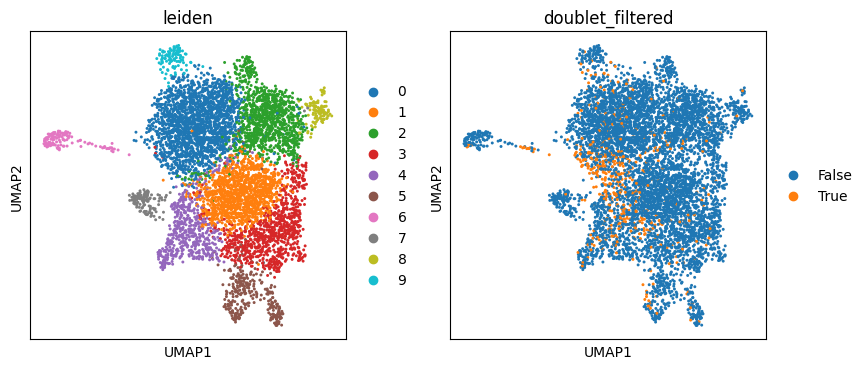

UMAP y distribución 'dif' generados para el paciente: PT_14


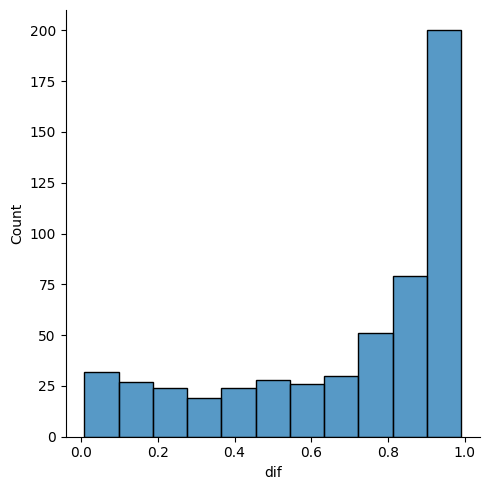

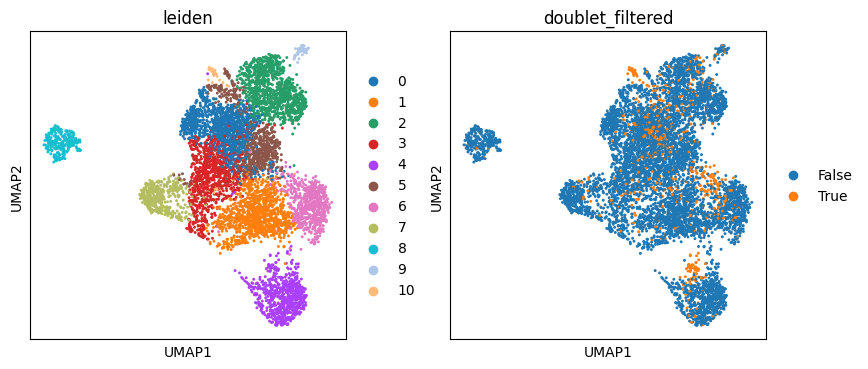

UMAP y distribución 'dif' generados para el paciente: PT_17


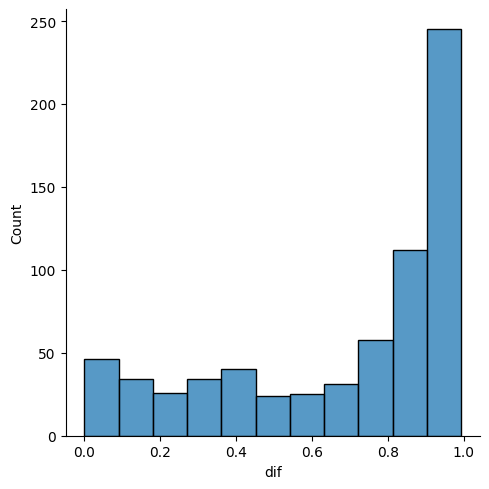

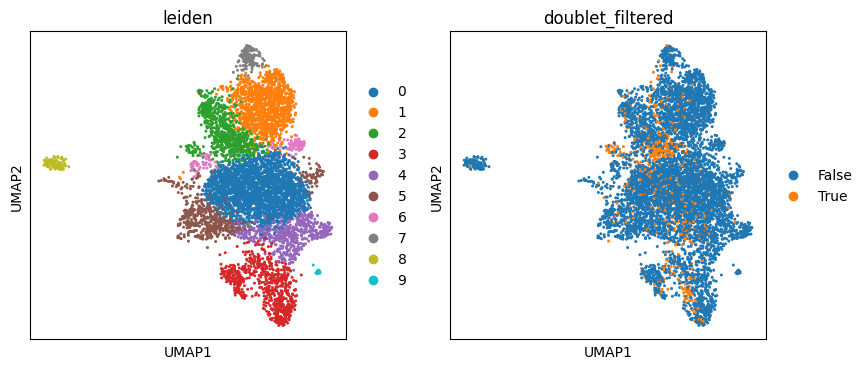

UMAP y distribución 'dif' generados para el paciente: PT_20


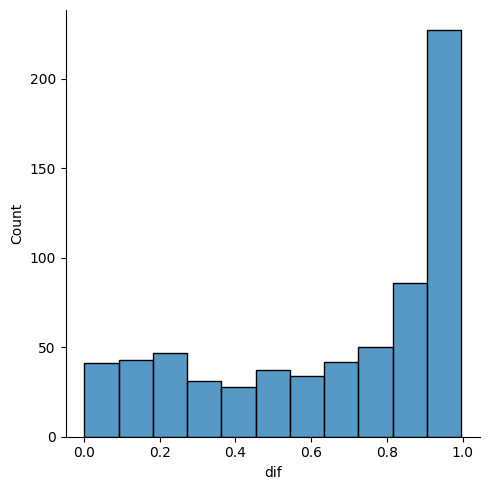

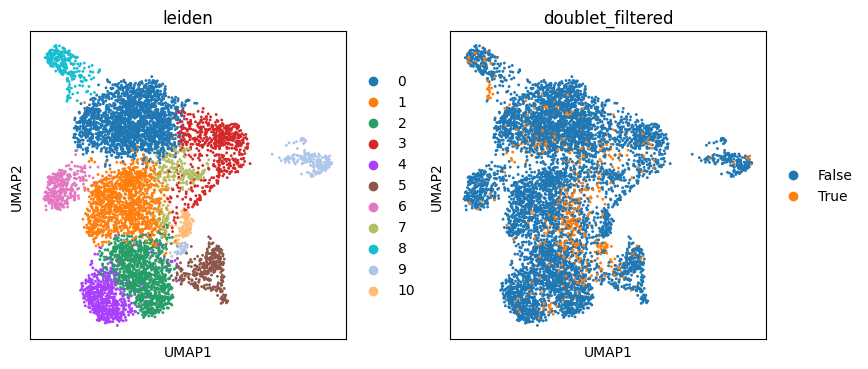

UMAP y distribución 'dif' generados para el paciente: PT_22


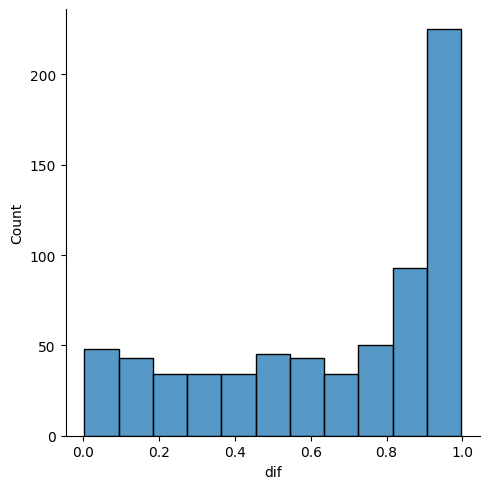

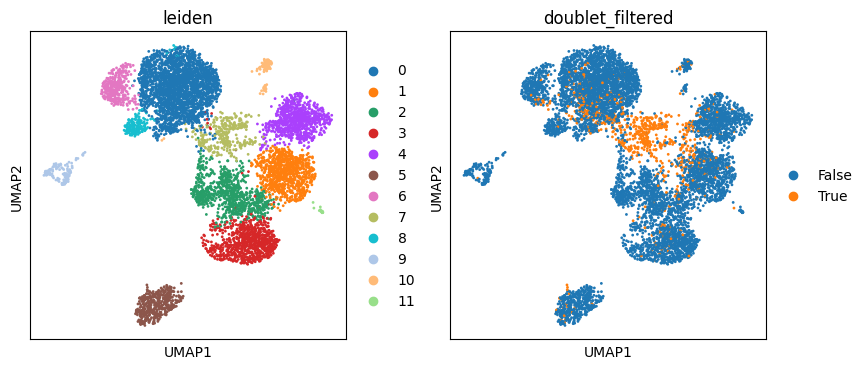

UMAP y distribución 'dif' generados para el paciente: PT_28


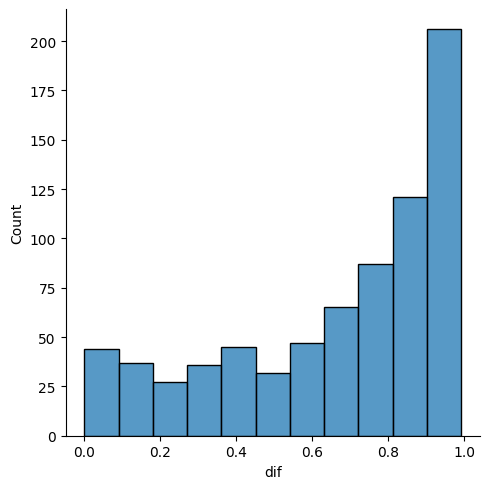

In [10]:
import scanpy as sc
import pandas as pd
from matplotlib.pyplot import rc_context
import seaborn as sns

# Ruta base para las predicciones SOLO
prediction_base_path = "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02_predict_dobletes/1.1_pred_dob_SoupX_5pt_Ovario/predicciones_dobletes/"

# Diccionario de archivos AnnData de los pacientes
patient_data = {
    "PT_14": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_14_corrected_SoupX.h5ad",
    "PT_17": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_17_corrected_SoupX.h5ad",
    "PT_20": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_20_corrected_SoupX.h5ad",
    "PT_22": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_22_corrected_SoupX.h5ad",
    "PT_28": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_28_corrected_SoupX.h5ad"
}

# Visualización del UMAP basado en el análisis previo
for patient_name, adata_path in patient_data.items():
    # Cargar los datos de AnnData
    adata = sc.read_h5ad(adata_path)

    # Cargar el DataFrame de predicciones SOLO
    df = pd.read_csv(f"{prediction_base_path}{patient_name}/solo_predictions_soupX.csv", index_col=0)
    
    # Añadir las predicciones al objeto AnnData
    adata.obs['doublet_filtered'] = df['prediction'] == 'doublet'
    
    # Calcular la diferencia entre la probabilidad de ser doblete y singlete
    df['dif'] = df['doublet'] - df['singlet']

    # Crear un objeto temporal para visualización
    adata_tmp = adata.copy()

    # Preprocesamiento para visualización (normalización, PCA, UMAP)
    sc.pp.normalize_total(adata_tmp, target_sum=1e4)
    sc.pp.log1p(adata_tmp)
    sc.tl.pca(adata_tmp)
    sc.pp.neighbors(adata_tmp)
    sc.tl.umap(adata_tmp)
    sc.tl.leiden(adata_tmp, resolution=0.5)

    # Visualización en UMAP con 'leiden' (clustering) y las predicciones previas de dobletes (si las tienes)
    with rc_context({'figure.figsize': (4, 4)}):
        sc.pl.umap(adata_tmp, color=['leiden', 'doublet_filtered'])  # Muestra los clústeres y dobletes filtrados

    # **Visualización de la distribución de 'dif' para los dobletes**
    sns.displot(df[df['prediction'] == 'doublet'], x='dif')

    print(f"UMAP y distribución 'dif' generados para el paciente: {patient_name}")


NUEVOS PACIENTES:

In [6]:
model_dirs = {
    "PT_18": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02_predict_dobletes/1.2_pred_dob_SoupX_5pt_pan_hepato/modelos/PT_18/vae_model/",
    "PT14_pan": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02_predict_dobletes/1.2_pred_dob_SoupX_5pt_pan_hepato/modelos/PT14_pan/vae_model/",
    "PT_41": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02_predict_dobletes/1.2_pred_dob_SoupX_5pt_pan_hepato/modelos/PT_41/vae_model/",
    "PT_49": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02_predict_dobletes/1.2_pred_dob_SoupX_5pt_pan_hepato/modelos/PT_49/vae_model/",
    "PT_50": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02_predict_dobletes/1.2_pred_dob_SoupX_5pt_pan_hepato/modelos/PT_50/vae_model/"
}

In [7]:
# Cargar los modelos y extraer el ELBO de entrenamiento
elbo_data = {}

for patient, model_dir in model_dirs.items():
    print(f"Cargando modelo para {patient}...")
    model = scvi.model.SCVI.load(model_dir)
    elbo_data[patient] = model.history["elbo_train"]

# Representar el ELBO de entrenamiento para todos los pacientes
plt.figure(figsize=(10, 6))
for patient, elbo in elbo_data.items():
    plt.plot(elbo, label=f"{patient}")

plt.xlabel("Época")
plt.ylabel("ELBO de entrenamiento")
plt.title("Curvas de ELBO de entrenamiento para cada paciente")
plt.legend()
plt.grid()
plt.show()

Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


Cargando modelo para PT_18...
INFO     File                                                                                                      
         /data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02_predict_dobletes/1.2_pred_dob_Sou
         pX_5pt_pan_hepato/modelos/PT_18/vae_model/model.pt already downloaded                                     


/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scvi/model/base/_utils.py:66: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path

RuntimeError: The NVIDIA driver on your system is too old (found version 11050). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver.

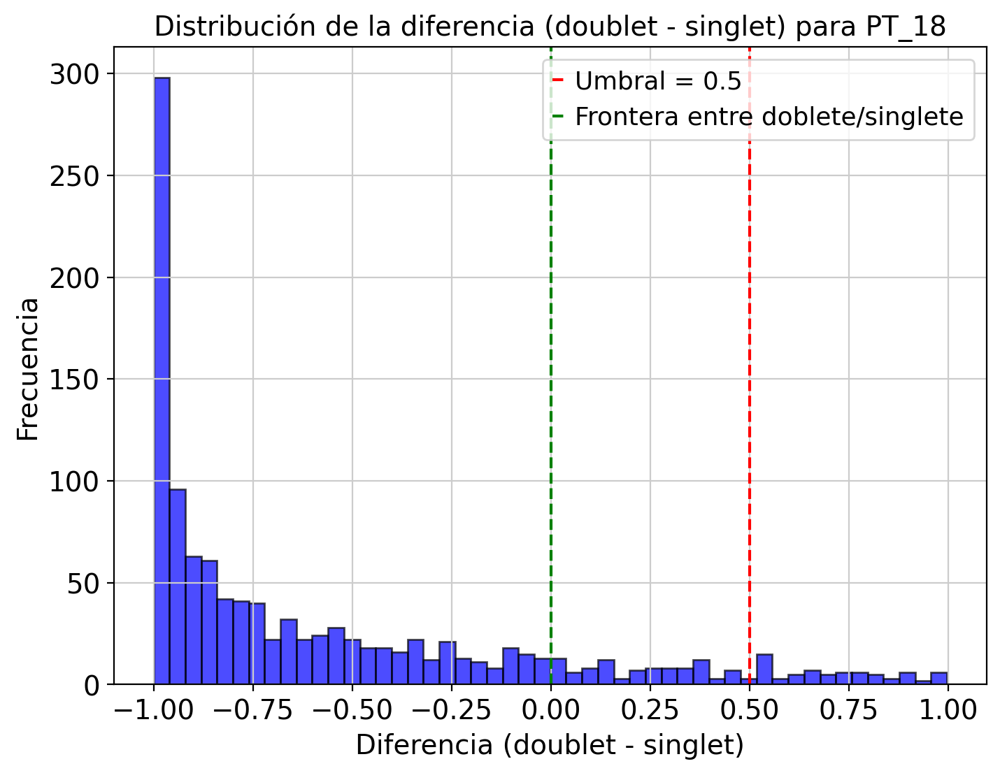

Paciente: PT_18
Total de células: 1143
Antes del umbral:
  Número de singletes: 976 (85.39%)
  Número de dobletes: 167 (14.61%)

Después del umbral (0.5):
  Número de singletes: 1073 (93.88%)
  Número de dobletes: 70 (6.12%)



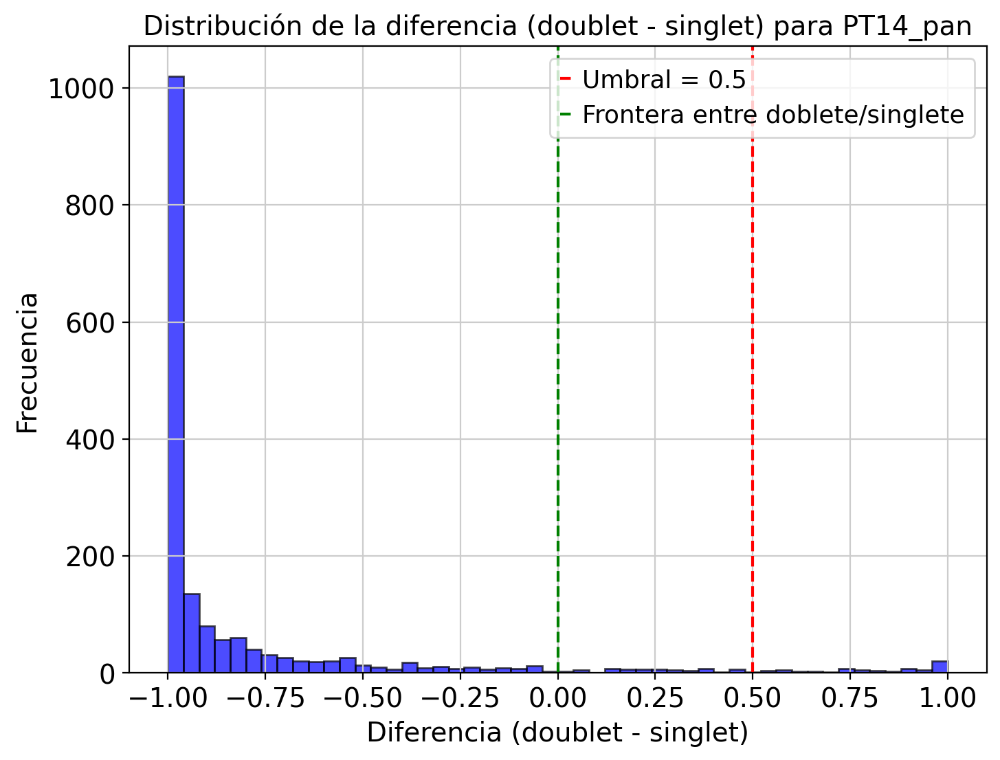

Paciente: PT14_pan
Total de células: 1788
Antes del umbral:
  Número de singletes: 1658 (92.73%)
  Número de dobletes: 130 (7.27%)

Después del umbral (0.5):
  Número de singletes: 1718 (96.09%)
  Número de dobletes: 70 (3.91%)



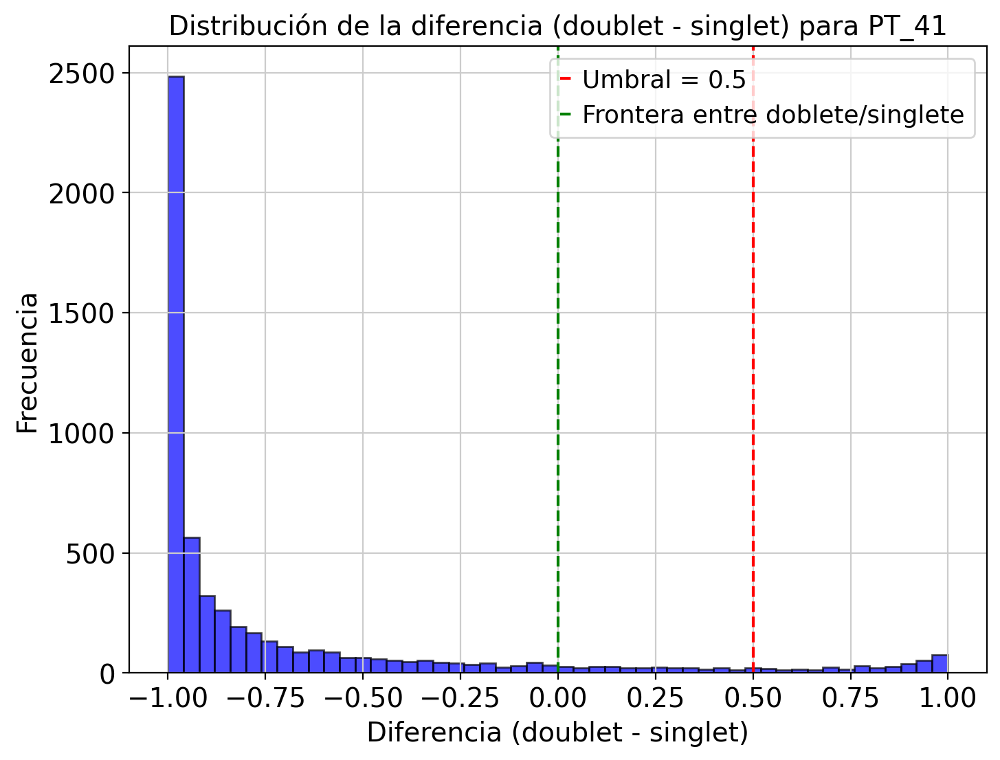

Paciente: PT_41
Total de células: 5773
Antes del umbral:
  Número de singletes: 5145 (89.12%)
  Número de dobletes: 628 (10.88%)

Después del umbral (0.5):
  Número de singletes: 5415 (93.80%)
  Número de dobletes: 358 (6.20%)



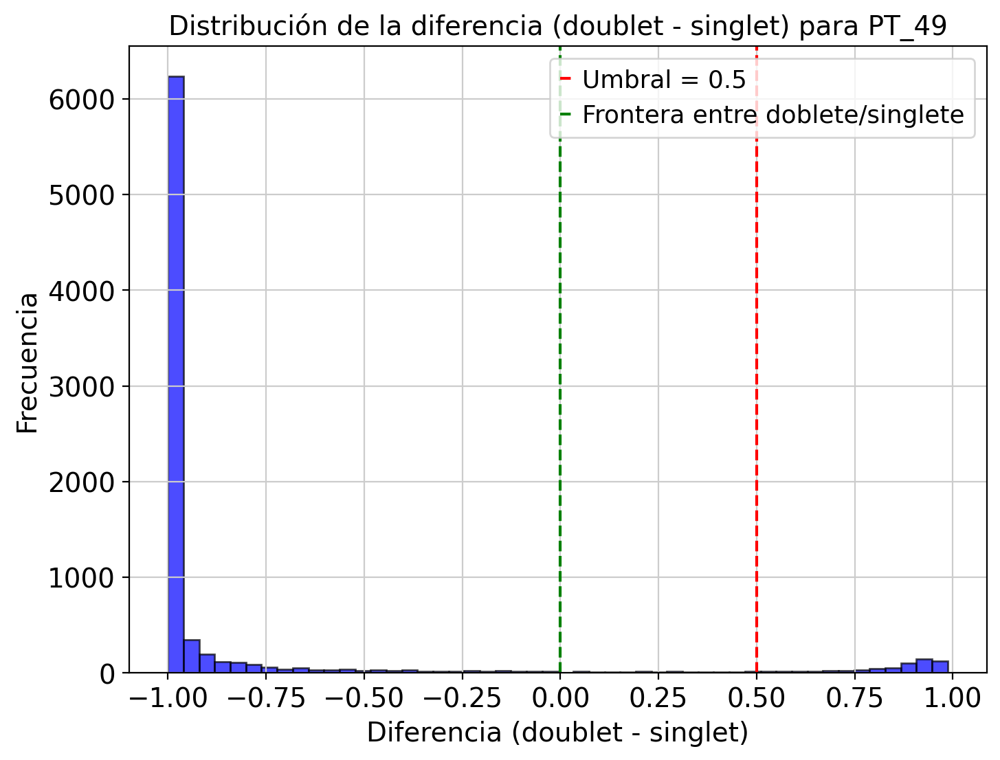

Paciente: PT_49
Total de células: 8419
Antes del umbral:
  Número de singletes: 7638 (90.72%)
  Número de dobletes: 781 (9.28%)

Después del umbral (0.5):
  Número de singletes: 7784 (92.46%)
  Número de dobletes: 635 (7.54%)



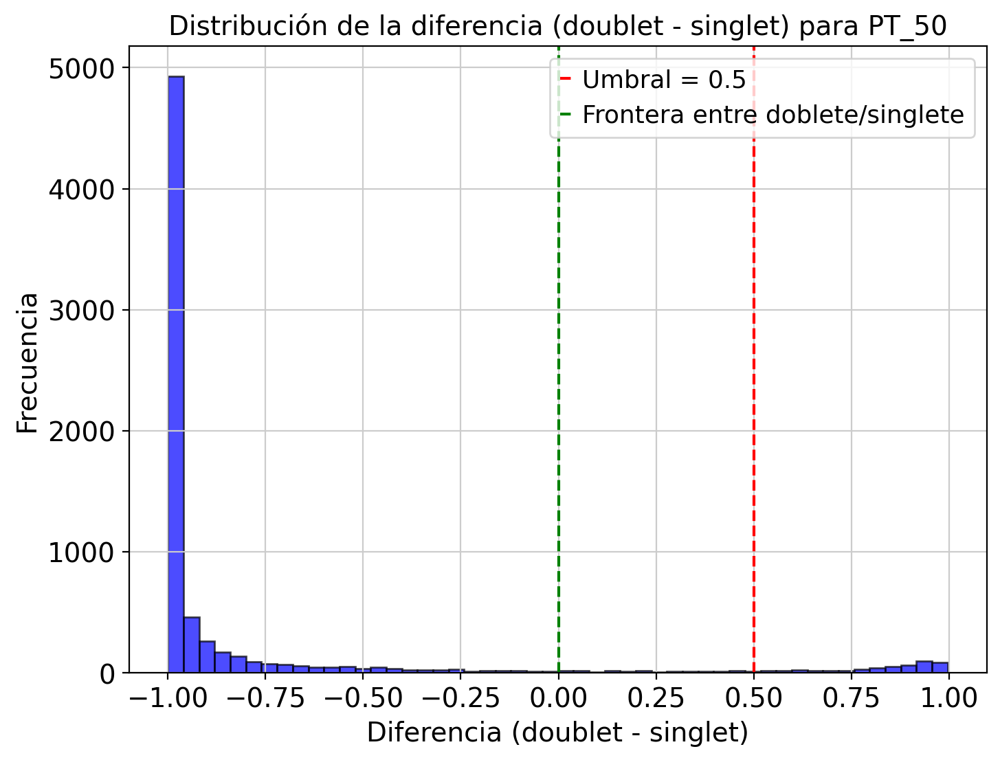

Paciente: PT_50
Total de células: 7447
Antes del umbral:
  Número de singletes: 6742 (90.53%)
  Número de dobletes: 705 (9.47%)

Después del umbral (0.5):
  Número de singletes: 6942 (93.22%)
  Número de dobletes: 505 (6.78%)



In [10]:
import pandas as pd
import matplotlib.pyplot as plt

# Diccionario de rutas a los archivos de predicciones SOLO
files = {
    "PT_18": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02_predict_dobletes/1.2_pred_dob_SoupX_5pt_pan_hepato/predicciones_dobletes/PT_18/solo_predictions_soupX.csv",
    "PT14_pan": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02_predict_dobletes/1.2_pred_dob_SoupX_5pt_pan_hepato/predicciones_dobletes/PT14_pan/solo_predictions_soupX.csv",
    "PT_41": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02_predict_dobletes/1.2_pred_dob_SoupX_5pt_pan_hepato/predicciones_dobletes/PT_41/solo_predictions_soupX.csv",
    "PT_49": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02_predict_dobletes/1.2_pred_dob_SoupX_5pt_pan_hepato/predicciones_dobletes/PT_49/solo_predictions_soupX.csv",
    "PT_50": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02_predict_dobletes/1.2_pred_dob_SoupX_5pt_pan_hepato/predicciones_dobletes/PT_50/solo_predictions_soupX.csv"
}

# Umbral a aplicar
umbral = 0.5

# Procesar cada paciente
for patient, file_path in files.items():
    # Cargar las predicciones de SOLO
    df = pd.read_csv(file_path, index_col=0)

    # Calcular la diferencia entre 'doublet' y 'singlet'
    df['dif'] = df['doublet'] - df['singlet']

    # Número total de células
    total_cells = df.shape[0]

    # Contar dobletes y singletes sin aplicar el umbral
    num_doublets = (df['dif'] > 0).sum()
    num_singlets = (df['dif'] <= 0).sum()

    # Aplicar el umbral
    df['filtered'] = df['dif'] > umbral

    # Contar dobletes y singletes después de aplicar el umbral
    num_doublets_filtered = df['filtered'].sum()
    num_singlets_filtered = total_cells - num_doublets_filtered

    # Visualizar la distribución de 'dif' para cada paciente
    plt.figure(figsize=(8, 6))
    plt.hist(df['dif'], bins=50, color='blue', alpha=0.7, edgecolor='black')
    plt.axvline(umbral, color='red', linestyle='--', label=f'Umbral = {umbral}')
    plt.axvline(0.0, color='green', linestyle='--', label='Frontera entre doblete/singlete')
    plt.title(f'Distribución de la diferencia (doublet - singlet) para {patient}')
    plt.xlabel('Diferencia (doublet - singlet)')
    plt.ylabel('Frecuencia')
    plt.legend()
    plt.show()

    # Imprimir resultados
    print(f"Paciente: {patient}")
    print(f"Total de células: {total_cells}")
    print(f"Antes del umbral:")
    print(f"  Número de singletes: {num_singlets} ({num_singlets / total_cells * 100:.2f}%)")
    print(f"  Número de dobletes: {num_doublets} ({num_doublets / total_cells * 100:.2f}%)\n")

    print(f"Después del umbral ({umbral}):")
    print(f"  Número de singletes: {num_singlets_filtered} ({num_singlets_filtered / total_cells * 100:.2f}%)")
    print(f"  Número de dobletes: {num_doublets_filtered} ({num_doublets_filtered / total_cells * 100:.2f}%)\n")


In [18]:
# Diccionario de archivos AnnData de los pacientes
patient_data = {
    "PT_14": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_14_corrected_SoupX.h5ad",
    "PT_17": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_17_corrected_SoupX.h5ad",
    "PT_20": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_20_corrected_SoupX.h5ad",
    "PT_22": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_22_corrected_SoupX.h5ad",
    "PT_28": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_28_corrected_SoupX.h5ad"
}

# Ruta base para las predicciones SOLO
prediction_base_path = "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02_predict_dobletes/1.1_pred_dob_SoupX_5pt_Ovario/predicciones_dobletes/"

# Umbral único para todos los pacientes
threshold = 0

# Ruta de salida para guardar los archivos AnnData con el metadata
output_dir = "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.2_patients_with_doublets_thresh_0.5/"

# Crear la carpeta de salida si no existe
os.makedirs(output_dir, exist_ok=True)

# Aplicar las predicciones de SOLO a cada paciente
for patient_name, adata_path in patient_data.items():
    # Cargar los datos de AnnData
    adata = sc.read_h5ad(adata_path)

    # Guardar una copia de las cuentas crudas corregidas por SoupX antes de normalizar
    adata.layers['counts_soupx_crude'] = adata.layers['soupX_counts'].copy()

    # Cargar el DataFrame de predicciones SOLO
    df = pd.read_csv(f"{prediction_base_path}{patient_name}/solo_predictions_soupX.csv", index_col=0)

    # Calcular la diferencia entre la probabilidad de ser doblete y singlete
    df['dif'] = df['doublet'] - df['singlet']

    # Filtrar basado en el umbral decidido
    doublets_filtered = df[df['dif'] > threshold]

    # Mapear los doublets filtrados al AnnData (umbral aplicado)
    adata.obs['doublet_filtered'] = adata.obs.index.isin(doublets_filtered.index)

    # Imprimir información celular
    total_cells = adata.shape[0]
    num_doublets = adata.obs['doublet_filtered'].sum()
    num_singlets = total_cells - num_doublets

    print(f"Paciente: {patient_name}")
    print(f"Total de células: {total_cells}")
    print(f"Número de singletes: {num_singlets} ({num_singlets / total_cells * 100:.2f}%)")
    print(f"Número de dobletes: {num_doublets} ({num_doublets / total_cells * 100:.2f}%)\n")

    # Guardar el AnnData con información de dobletes
    #output_path = os.path.join(output_dir, f"{patient_name}_with_doublets_metadata.h5ad")
    #adata.write_h5ad(output_path)

    #print(f"Guardando archivo para {patient_name} en {output_path}")



Paciente: PT_14
Total de células: 6634
Número de singletes: 6094 (91.86%)
Número de dobletes: 540 (8.14%)

Paciente: PT_17
Total de células: 6801
Número de singletes: 6126 (90.07%)
Número de dobletes: 675 (9.93%)

Paciente: PT_20
Total de células: 6566
Número de singletes: 5900 (89.86%)
Número de dobletes: 666 (10.14%)

Paciente: PT_22
Total de células: 7097
Número de singletes: 6414 (90.38%)
Número de dobletes: 683 (9.62%)

Paciente: PT_28
Total de células: 7502
Número de singletes: 6755 (90.04%)
Número de dobletes: 747 (9.96%)



In [17]:
# Diccionario de archivos AnnData de los pacientes
patient_data = {
    "PT_18": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_18_corrected_SoupX.h5ad",
    "PT14_pan": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT14_pan_corrected_SoupX.h5ad",
    "PT_41": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_41_corrected_SoupX.h5ad",
    "PT_49": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_49_corrected_SoupX.h5ad",
    "PT_50": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_50_corrected_SoupX.h5ad"
}

# Ruta base para las predicciones SOLO
prediction_base_path = "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02_predict_dobletes/1.2_pred_dob_SoupX_5pt_pan_hepato/predicciones_dobletes/"

# Umbral único para todos los pacientes
threshold = 0.5

# Ruta de salida para guardar los archivos AnnData con el metadata
output_dir = "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.2_patients_with_doublets_thresh_0.5/"

# Crear la carpeta de salida si no existe
os.makedirs(output_dir, exist_ok=True)

# Aplicar las predicciones de SOLO a cada paciente
for patient_name, adata_path in patient_data.items():
    # Cargar los datos de AnnData
    adata = sc.read_h5ad(adata_path)

    # Guardar una copia de las cuentas crudas corregidas por SoupX antes de normalizar
    adata.layers['counts_soupx_crude'] = adata.layers['soupX_counts'].copy()

    # Cargar el DataFrame de predicciones SOLO
    df = pd.read_csv(f"{prediction_base_path}{patient_name}/solo_predictions_soupX.csv", index_col=0)

    # Calcular la diferencia entre la probabilidad de ser doblete y singlete
    df['dif'] = df['doublet'] - df['singlet']

    # Filtrar basado en el umbral decidido
    doublets_filtered = df[df['dif'] > threshold]

    # Mapear los doublets filtrados al AnnData (umbral aplicado)
    adata.obs['doublet_filtered'] = adata.obs.index.isin(doublets_filtered.index)

    # Imprimir información celular
    total_cells = adata.shape[0]
    num_doublets = adata.obs['doublet_filtered'].sum()
    num_singlets = total_cells - num_doublets

    print(f"Paciente: {patient_name}")
    print(f"Total de células: {total_cells}")
    print(f"Número de singletes: {num_singlets} ({num_singlets / total_cells * 100:.2f}%)")
    print(f"Número de dobletes: {num_doublets} ({num_doublets / total_cells * 100:.2f}%)\n")

    # Guardar el AnnData con información de dobletes
    output_path = os.path.join(output_dir, f"{patient_name}_with_doublets_metadata.h5ad")
    adata.write_h5ad(output_path)

    print(f"Guardando archivo para {patient_name} en {output_path}")


Paciente: PT_18
Total de células: 1143
Número de singletes: 1073 (93.88%)
Número de dobletes: 70 (6.12%)

Guardando archivo para PT_18 en /data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.2_patients_with_doublets_thresh_0.5/PT_18_with_doublets_metadata.h5ad
Paciente: PT14_pan
Total de células: 1788
Número de singletes: 1718 (96.09%)
Número de dobletes: 70 (3.91%)

Guardando archivo para PT14_pan en /data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.2_patients_with_doublets_thresh_0.5/PT14_pan_with_doublets_metadata.h5ad
Paciente: PT_41
Total de células: 5773
Número de singletes: 5415 (93.80%)
Número de dobletes: 358 (6.20%)

Guardando archivo para PT_41 en /data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.2_patients_with_doublets_thresh_0.5/PT_41_with_doublets_metadata.h5ad
Paciente: PT_49
Total de células: 8419
Número de singletes: 7784 (92.46%)
Número de dobletes: 635 (7.54%)

Guardando archivo para PT_49 en /data/sc

Si representamos el UMAP con aquellas que solo se consideran dobletes por encima de 0.5:

/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Catego

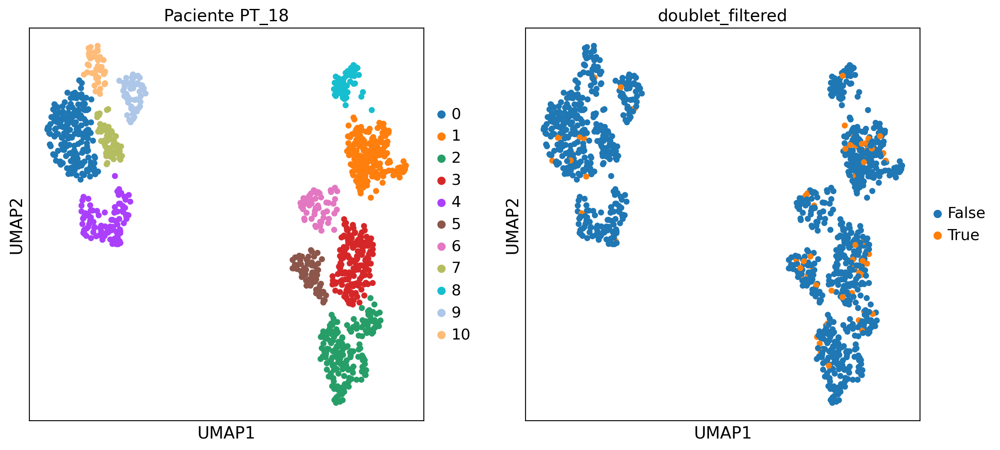

UMAP generado para el paciente: PT_18


/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Catego

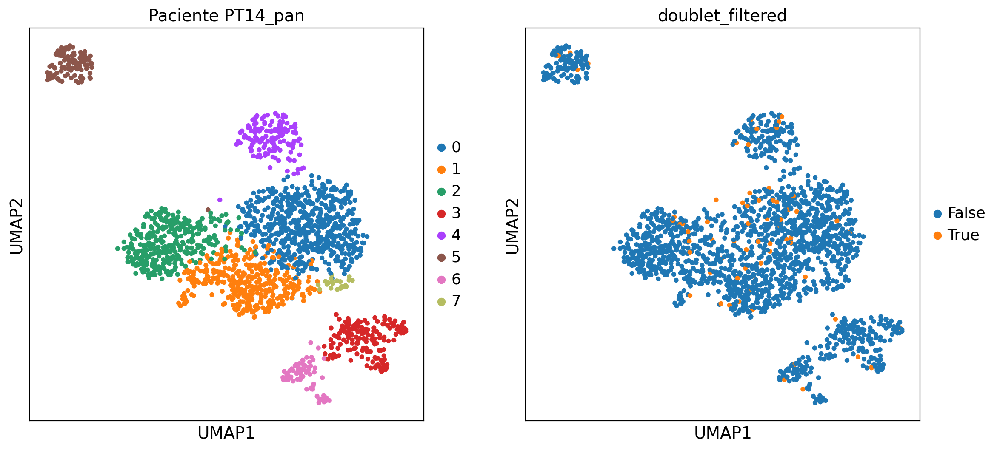

UMAP generado para el paciente: PT14_pan


/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Catego

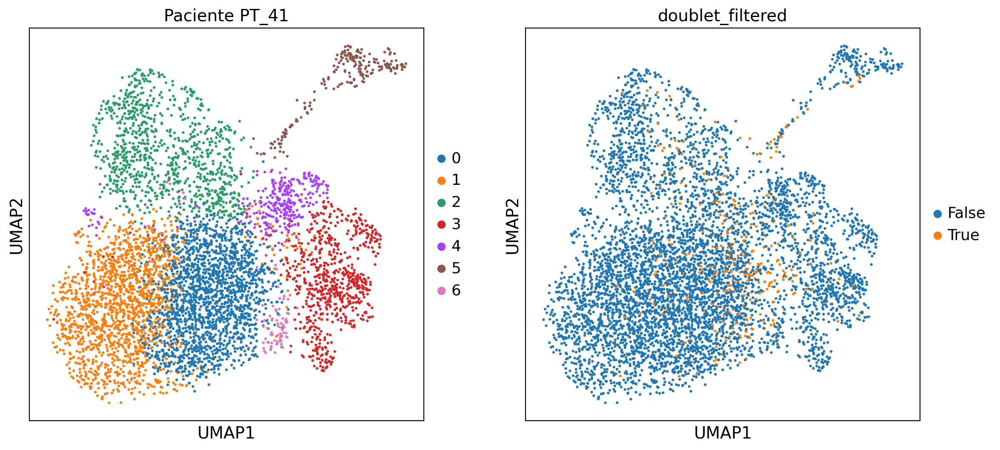

UMAP generado para el paciente: PT_41


/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Catego

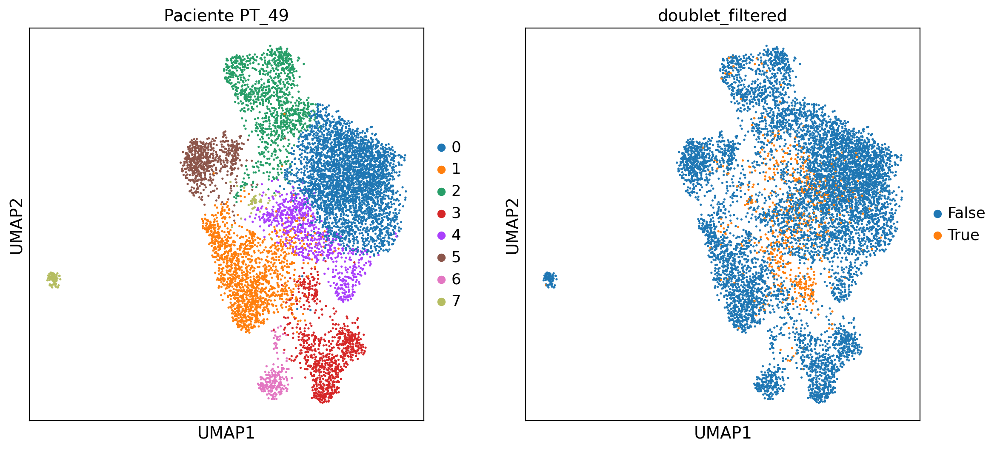

UMAP generado para el paciente: PT_49


/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Catego

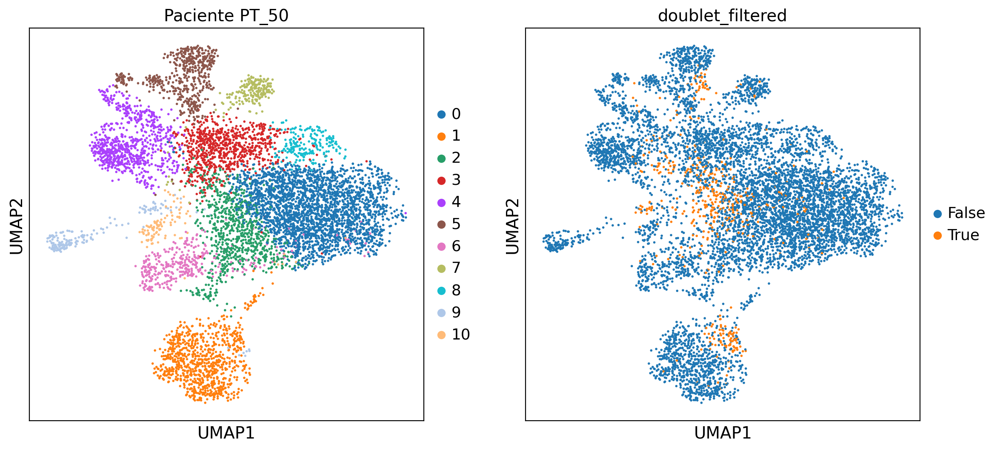

UMAP generado para el paciente: PT_50


In [15]:
import scanpy as sc
from matplotlib.pyplot import rc_context

# Diccionario de archivos AnnData con dobletes ya procesados
patient_data = {
    "PT_18": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.2_patients_with_doublets_thresh_0.5/PT_18_with_doublets_metadata.h5ad",
    "PT14_pan": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.2_patients_with_doublets_thresh_0.5/PT14_pan_with_doublets_metadata.h5ad",
    "PT_41": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.2_patients_with_doublets_thresh_0.5/PT_41_with_doublets_metadata.h5ad",
    "PT_49": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.2_patients_with_doublets_thresh_0.5/PT_49_with_doublets_metadata.h5ad",
    "PT_50": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.2_patients_with_doublets_thresh_0.5/PT_50_with_doublets_metadata.h5ad"
}

# Generar UMAP para visualizar los dobletes
for patient_name, adata_path in patient_data.items():
    # Cargar los datos de AnnData con los metadatos de dobletes
    adata = sc.read_h5ad(adata_path)

    # Asegurarse de que la columna 'doublet_filtered' sea de tipo 'category'
    adata.obs['doublet_filtered'] = adata.obs['doublet_filtered'].astype('category')

    # Crear un objeto temporal para visualización
    adata_tmp = adata.copy()

    # Preprocesamiento para visualización (normalización, PCA, UMAP)
    sc.pp.normalize_total(adata_tmp, target_sum=1e4)
    sc.pp.log1p(adata_tmp)
    sc.tl.pca(adata_tmp)
    sc.pp.neighbors(adata_tmp)
    sc.tl.umap(adata_tmp)
    sc.tl.leiden(adata_tmp, resolution=0.5)

    # Visualización en UMAP con 'leiden' (clustering) y las predicciones de dobletes
    with rc_context({'figure.figsize': (6, 6)}):
        sc.pl.umap(adata_tmp, color=['leiden', 'doublet_filtered'], title=f"Paciente {patient_name}")

    print(f"UMAP generado para el paciente: {patient_name}")


SI DIRECTAMENTE ELIMINAMOS LAS PREDICHAS POR SOLO:

/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Catego

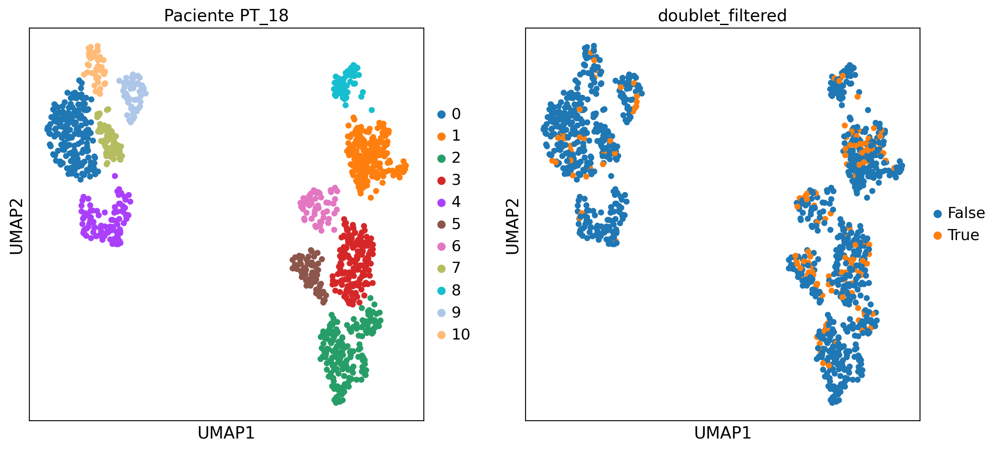

UMAP generado para el paciente: PT_18


/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Catego

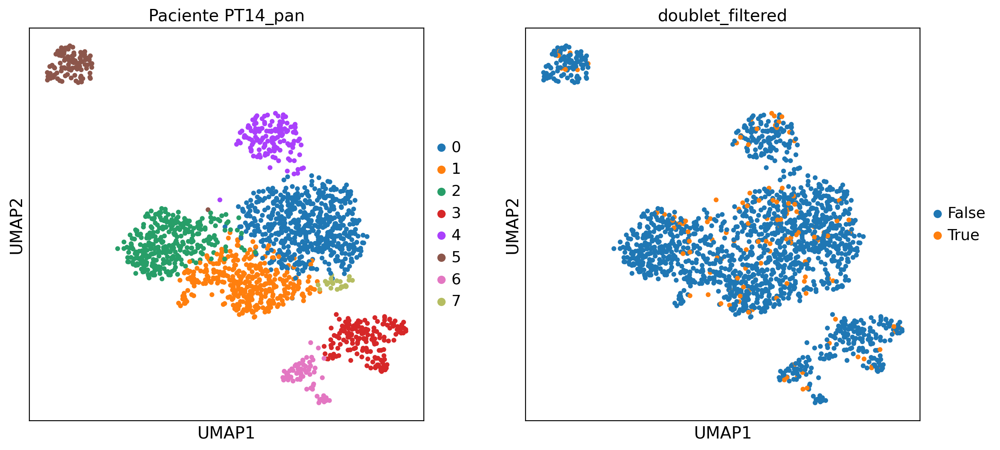

UMAP generado para el paciente: PT14_pan


/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Catego

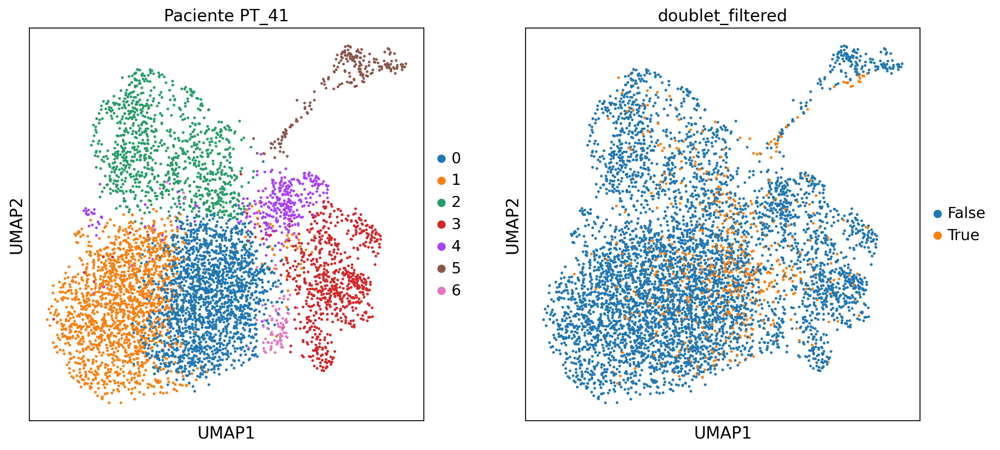

UMAP generado para el paciente: PT_41


/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Catego

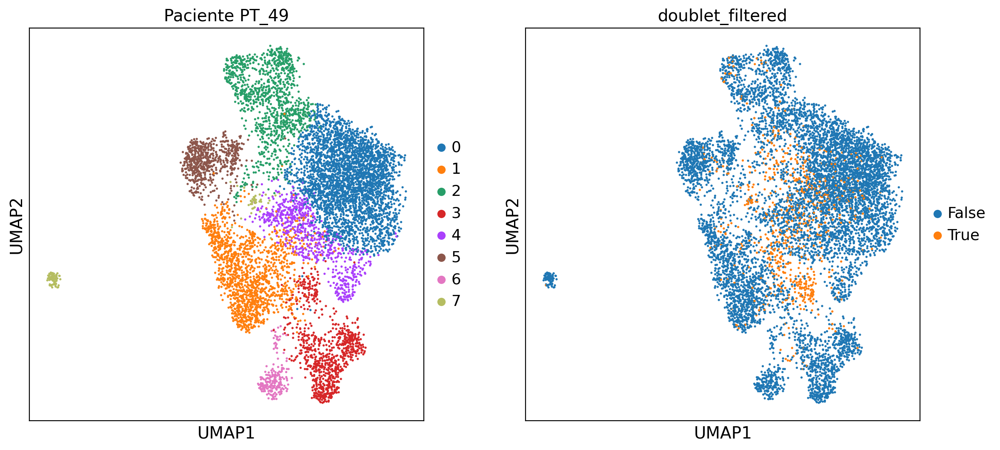

UMAP generado para el paciente: PT_49


/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/evercher/miniforge3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Catego

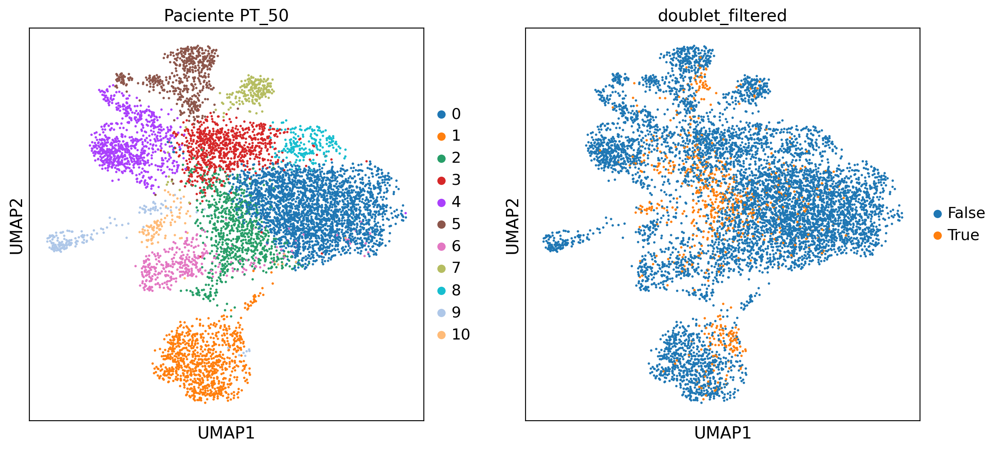

UMAP generado para el paciente: PT_50


In [17]:
import scanpy as sc
import pandas as pd
from matplotlib.pyplot import rc_context

# Diccionario de archivos AnnData de los pacientes
patient_data = {
    "PT_18": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_18_corrected_SoupX.h5ad",
    "PT14_pan": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT14_pan_corrected_SoupX.h5ad",
    "PT_41": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_41_corrected_SoupX.h5ad",
    "PT_49": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_49_corrected_SoupX.h5ad",
    "PT_50": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_50_corrected_SoupX.h5ad"
}


# Ruta base para las predicciones SOLO
prediction_base_path = "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02_predict_dobletes/1.2_pred_dob_SoupX_5pt_pan_hepato/predicciones_dobletes/"

# Generar UMAPs basados en la predicción de SOLO
for patient_name, adata_path in patient_data.items():
    # Cargar los datos de AnnData
    adata = sc.read_h5ad(adata_path)

    # Cargar el DataFrame de predicciones SOLO
    df = pd.read_csv(f"{prediction_base_path}{patient_name}/solo_predictions_soupX.csv", index_col=0)

    # Marcar doublets según la predicción de SOLO (directamente)
    adata.obs['doublet_filtered'] = df['prediction'] == 'doublet'

    # Asegurar que 'doublet_filtered' sea tipo 'category' para la visualización
    adata.obs['doublet_filtered'] = adata.obs['doublet_filtered'].astype('category')

    # Crear un objeto temporal para visualización
    adata_tmp = adata.copy()

    # Preprocesamiento para visualización (normalización, PCA, UMAP)
    sc.pp.normalize_total(adata_tmp, target_sum=1e4)
    sc.pp.log1p(adata_tmp)
    sc.tl.pca(adata_tmp)
    sc.pp.neighbors(adata_tmp)
    sc.tl.umap(adata_tmp)
    sc.tl.leiden(adata_tmp, resolution=0.5)

    # Visualización en UMAP con 'leiden' (clustering) y las predicciones de dobletes
    with rc_context({'figure.figsize': (6, 6)}):
        sc.pl.umap(adata_tmp, color=['leiden', 'doublet_filtered'], title=f"Paciente {patient_name}")

    print(f"UMAP generado para el paciente: {patient_name}")


Eliminamos todas las células predichas como dobletes por SOLO, es decir con threshold=0:

In [18]:
import scanpy as sc
import pandas as pd

# Diccionario de archivos AnnData de los pacientes
patient_data = {
    "PT_18": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_18_corrected_SoupX.h5ad",
    "PT14_pan": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT14_pan_corrected_SoupX.h5ad",
    "PT_41": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_41_corrected_SoupX.h5ad",
    "PT_49": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_49_corrected_SoupX.h5ad",
    "PT_50": "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/01_matrices_corregidas_SoupX/PT_50_corrected_SoupX.h5ad"
}


# Ruta base para las predicciones SOLO
prediction_base_path = "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02_predict_dobletes/1.2_pred_dob_SoupX_5pt_pan_hepato/predicciones_dobletes/"

# Aplicar las predicciones de SOLO a cada paciente
for patient_name, adata_path in patient_data.items():
    # Cargar los datos de AnnData
    adata = sc.read_h5ad(adata_path)

    # Guardar una copia de las cuentas crudas corregidas por SoupX antes de normalizar
    adata.layers['counts_soupx_crude'] = adata.layers['soupX_counts'].copy()

    # Cargar el DataFrame de predicciones SOLO
    df = pd.read_csv(f"{prediction_base_path}{patient_name}/solo_predictions_soupX.csv", index_col=0)

    # Filtrar las células marcadas como `doublet`
    doublets = df[df['prediction'] == 'doublet'].index
    adata_filtered = adata[~adata.obs_names.isin(doublets)].copy()

    # Guardar el AnnData filtrado sin dobletes en la nueva ruta especificada
    output_path = f"/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.1_patients_wo_doublets/{patient_name}_sin_doublets.h5ad"
    adata_filtered.write_h5ad(output_path)

    # Imprimir información celular
    total_cells = adata.shape[0]
    filtered_cells = adata_filtered.shape[0]
    removed_cells = total_cells - filtered_cells

    print(f"Paciente: {patient_name}")
    print(f"Total de células originales: {total_cells}")
    print(f"Total de células después de filtrar: {filtered_cells}")
    print(f"Número de células eliminadas (dobletes): {removed_cells} ({removed_cells / total_cells * 100:.2f}%)")
    print(f"Archivo guardado: {output_path}\n")

Paciente: PT_18
Total de células originales: 1143
Total de células después de filtrar: 976
Número de células eliminadas (dobletes): 167 (14.61%)
Archivo guardado: /data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/patients_wo_doublets/PT_18_sin_doublets.h5ad

Paciente: PT14_pan
Total de células originales: 1788
Total de células después de filtrar: 1658
Número de células eliminadas (dobletes): 130 (7.27%)
Archivo guardado: /data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/patients_wo_doublets/PT14_pan_sin_doublets.h5ad

Paciente: PT_41
Total de células originales: 5773
Total de células después de filtrar: 5145
Número de células eliminadas (dobletes): 628 (10.88%)
Archivo guardado: /data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/patients_wo_doublets/PT_41_sin_doublets.h5ad

Paciente: PT_49
Total de células originales: 8419
Total de células después de filtrar: 7638
Número de células eliminadas (dobletes): 781 (9.28%)
Archivo gua